In [2]:
import pandas as pd
import numpy as np
import json

## Read data

In [3]:
users = pd.read_csv('ml1m/content/dataset/users.dat', sep='::',
                    engine='python',
                    names=['userid', 'gender', 'age', 'occupation', 'zip'])
users

,userid,gender,age,occupation,zip
0,1,F,1,10,48067
1,2,M,56,16,70072
2,3,M,25,15,55117
3,4,M,45,7,02460
4,5,M,25,20,55455
...,...,...,...,...,...
6035,6036,F,25,15,32603
6036,6037,F,45,1,76006
6037,6038,F,56,1,14706
6038,6039,F,45,0,01060


In [4]:
ratings = pd.read_csv('ml1m/content/dataset/ratings.dat', engine='python',
                      sep='::', names=['userid', 'movieid', 'rating', 'timestamp'])
ratings

,userid,movieid,rating,timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291
...,...,...,...,...
1000204,6040,1091,1,956716541
1000205,6040,1094,5,956704887
1000206,6040,562,5,956704746
1000207,6040,1096,4,956715648


In [5]:
movies = pd.read_csv('ml1m/content/dataset/movies_train.dat', engine='python',
                     sep='::', names=['movieid', 'title', 'genre'], 
                     encoding='latin-1', index_col=False)
movies['genre'] = movies['genre'].apply(lambda x: x.split('|'))
movies['year'] = movies['title'].apply(lambda x: x[-5:-1])
movies['title'] = movies['title'].apply(lambda x: x[:-7])
movies

,movieid,title,genre,year
0,1650,Washington Square,[Drama],1997
1,185,"Net, The","[Sci-Fi, Thriller]",1995
2,1377,Batman Returns,"[Action, Adventure, Comedy, Crime]",1992
3,3204,"Boys from Brazil, The",[Thriller],1978
4,1901,Dear Jesse,[Documentary],1997
...,...,...,...,...
3101,2539,Analyze This,[Comedy],1999
3102,3038,"Face in the Crowd, A",[Drama],1957
3103,1832,Heaven's Burning,"[Action, Drama]",1997
3104,657,Yankee Zulu,"[Comedy, Drama]",1994


In [6]:
# split movies by genres: each movie has multiple genres -> split into multiple rows
movies_split = movies.copy()
movies_split = movies_split.explode('genre')
movies_split

,movieid,title,genre,year
0,1650,Washington Square,Drama,1997
1,185,"Net, The",Sci-Fi,1995
1,185,"Net, The",Thriller,1995
2,1377,Batman Returns,Action,1992
2,1377,Batman Returns,Adventure,1992
...,...,...,...,...
3104,657,Yankee Zulu,Drama,1994
3105,1750,Star Kid,Adventure,1997
3105,1750,Star Kid,Children's,1997
3105,1750,Star Kid,Fantasy,1997


In [7]:
movies_split['movieid'].unique().shape

(3106,)

## Merge data

In [8]:
users_ratings_movies = pd.merge(pd.merge(ratings, users, on='userid'), 
                                movies, on='movieid')
users_ratings_movies['ratingid'] = users_ratings_movies.index + 1
users_ratings_movies

,userid,movieid,rating,timestamp,gender,age,occupation,zip,title,genre,year,ratingid
0,1,1193,5,978300760,F,1,10,48067,One Flew Over the Cuckoo's Nest,[Drama],1975,1
1,2,1193,5,978298413,M,56,16,70072,One Flew Over the Cuckoo's Nest,[Drama],1975,2
2,12,1193,4,978220179,M,25,12,32793,One Flew Over the Cuckoo's Nest,[Drama],1975,3
3,15,1193,4,978199279,M,25,7,22903,One Flew Over the Cuckoo's Nest,[Drama],1975,4
4,17,1193,5,978158471,M,50,1,95350,One Flew Over the Cuckoo's Nest,[Drama],1975,5
...,...,...,...,...,...,...,...,...,...,...,...,...
817419,5433,286,3,960240881,F,35,17,45014,Nemesis 2: Nebula,"[Action, Sci-Fi, Thriller]",1995,817420
817420,5556,2198,3,959445515,M,45,6,92103,Modulations,[Documentary],1998,817421
817421,5949,2198,5,958846401,M,18,17,47901,Modulations,[Documentary],1998,817422
817422,5675,2703,3,976029116,M,35,14,30030,Broken Vessels,[Drama],1998,817423


In [9]:
# show nan values
users_ratings_movies[users_ratings_movies.isnull().any(axis=1)]

,userid,movieid,rating,timestamp,gender,age,occupation,zip,title,genre,year,ratingid


In [10]:
# drop nan values
users_ratings_movies = users_ratings_movies.dropna()
users_ratings_movies = users_ratings_movies.explode('genre')
users_ratings_movies

,userid,movieid,rating,timestamp,gender,age,occupation,zip,title,genre,year,ratingid
0,1,1193,5,978300760,F,1,10,48067,One Flew Over the Cuckoo's Nest,Drama,1975,1
1,2,1193,5,978298413,M,56,16,70072,One Flew Over the Cuckoo's Nest,Drama,1975,2
2,12,1193,4,978220179,M,25,12,32793,One Flew Over the Cuckoo's Nest,Drama,1975,3
3,15,1193,4,978199279,M,25,7,22903,One Flew Over the Cuckoo's Nest,Drama,1975,4
4,17,1193,5,978158471,M,50,1,95350,One Flew Over the Cuckoo's Nest,Drama,1975,5
...,...,...,...,...,...,...,...,...,...,...,...,...
817419,5433,286,3,960240881,F,35,17,45014,Nemesis 2: Nebula,Thriller,1995,817420
817420,5556,2198,3,959445515,M,45,6,92103,Modulations,Documentary,1998,817421
817421,5949,2198,5,958846401,M,18,17,47901,Modulations,Documentary,1998,817422
817422,5675,2703,3,976029116,M,35,14,30030,Broken Vessels,Drama,1998,817423


## Genres

In [11]:
all_genres = open('ml1m/content/dataset/genres.txt', 'r').readlines()
all_genres = [genre.strip() for genre in all_genres]
all_genres

['Crime',
 'Thriller',
 'Fantasy',
 'Horror',
 'Sci-Fi',
 'Comedy',
 'Documentary',
 'Adventure',
 'Film-Noir',
 'Animation',
 'Romance',
 'Drama',
 'Western',
 'Musical',
 'Action',
 'Mystery',
 'War',
 "Children's"]

## Most popular genres

In [12]:
genre_counts = movies_split.groupby('genre').size().sort_values(ascending=False)
genre_counts_table = pd.DataFrame(genre_counts, columns=['count'])
genre_counts_table

,count
genre,
Drama,1294
Comedy,953
Action,413
Thriller,386
Romance,377
Horror,268
Adventure,235
Sci-Fi,228
Children's,203


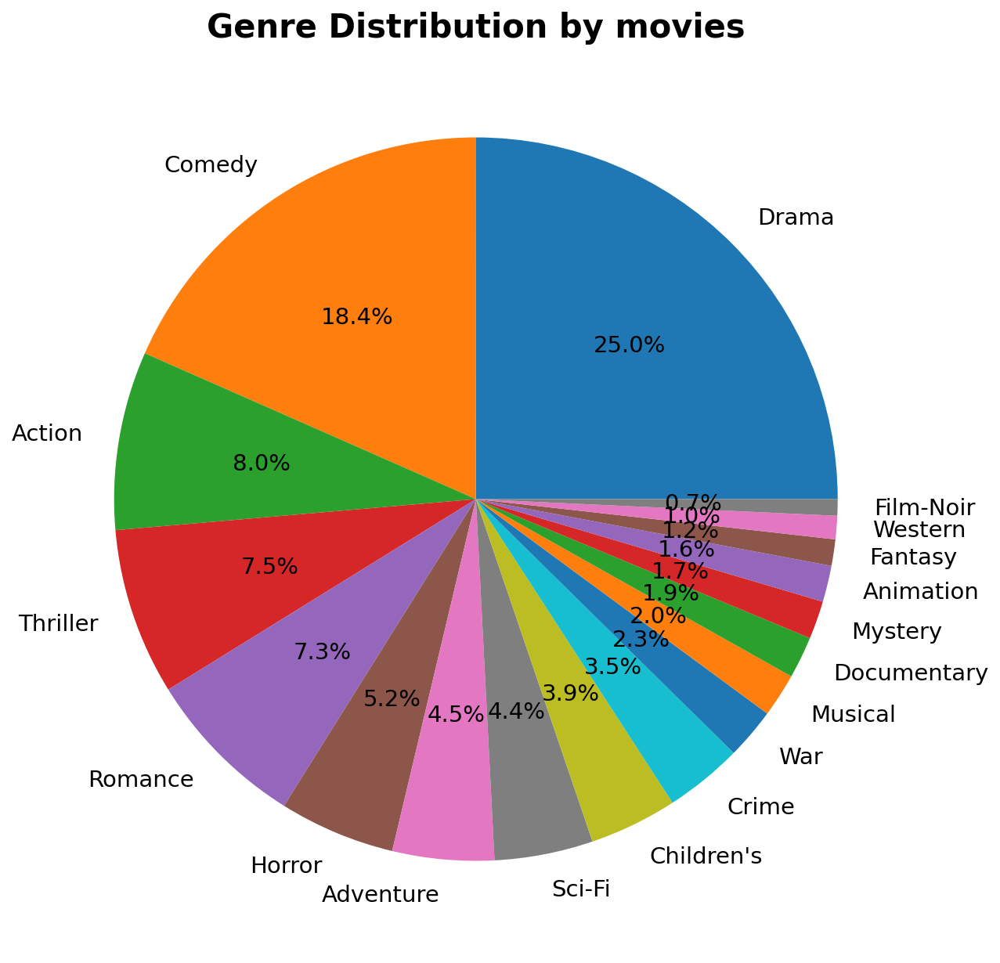

In [13]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10), dpi=150)
plt.pie(genre_counts_table['count'], 
        labels=genre_counts_table.index, 
        autopct='%1.1f%%',
        textprops={'fontsize': 14})
plt.title('Genre Distribution by movies', 
          fontdict={'fontsize': 20, 'fontweight': 'bold'})
plt.show()

## Genres with genders

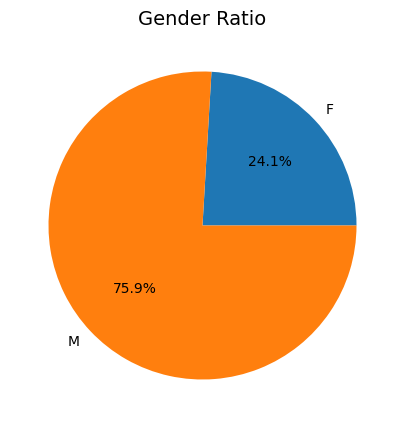

In [14]:
gender_counts = users_ratings_movies.groupby('gender').size()
gender_ratio = gender_counts / gender_counts.sum()

plt.figure(figsize=(5, 5))
plt.pie(gender_ratio, labels=gender_ratio.index, autopct='%1.1f%%')
plt.title('Gender Ratio', fontdict={'fontsize': 14})
plt.show()


In [15]:
women_average_ratings = users_ratings_movies[users_ratings_movies['gender'] == 'F'].groupby('genre')['rating'].mean()

# 5 highest ratings genres rated by women
women_average_ratings.sort_values(ascending=False).to_frame().head(5)

,rating
genre,
Film-Noir,4.054220
Documentary,3.977241
War,3.897844
Musical,3.817273
Drama,3.771368


In [16]:
# 5 lowest ratings genres rated by women
women_average_ratings.sort_values(ascending=True).to_frame().head(5)

,rating
genre,
Horror,3.235195
Sci-Fi,3.474107
Fantasy,3.492850
Action,3.515081
Adventure,3.527407


In [17]:
# 5 highest ratings genres rated by men users
men_average_ratings = users_ratings_movies[users_ratings_movies['gender'] == 'M'].groupby('genre')['rating'].mean()
men_average_ratings.sort_values(ascending=False).to_frame().head(5)

,rating
genre,
Film-Noir,4.135164
Documentary,3.933570
War,3.902608
Drama,3.776850
Crime,3.730776


In [18]:
men_average_ratings.sort_values(ascending=True).to_frame().head(5)

,rating
genre,
Horror,3.236520
Children's,3.375230
Fantasy,3.417457
Adventure,3.488603
Sci-Fi,3.507161


In [19]:
gender_average_ratings = pd.DataFrame(index=all_genres)
gender_average_ratings['avg_women_ratings'] = women_average_ratings
gender_average_ratings['avg_men_ratings'] = men_average_ratings
gender_average_ratings.sort_values(by='avg_women_ratings', ascending=False)


,avg_women_ratings,avg_men_ratings
Film-Noir,4.054220,4.135164
Documentary,3.977241,3.933570
War,3.897844,3.902608
Musical,3.817273,3.619684
Drama,3.771368,3.776850
Animation,3.750095,3.670603
Crime,3.705002,3.730776
Mystery,3.693323,3.664096
Romance,3.688663,3.600180
Thriller,3.593046,3.598942


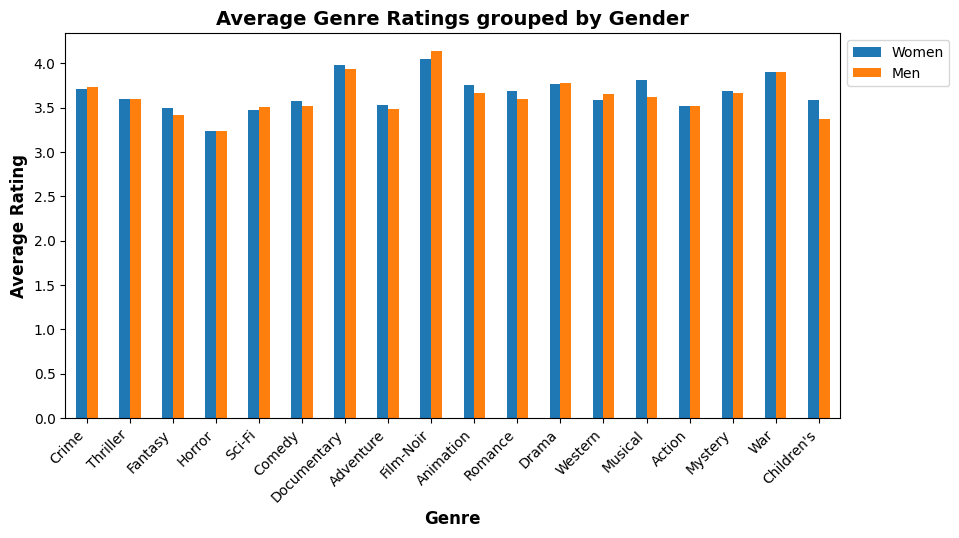

In [20]:
gender_average_ratings.plot(kind='bar', figsize=(10, 5))

plt.xticks(rotation=45, ha='right')
plt.xlabel('Genre', fontdict={'fontsize': 12, 'fontweight': 'bold'})
plt.ylabel('Average Rating', fontdict={'fontsize': 12, 'fontweight': 'bold'})
plt.title('Average Genre Ratings grouped by Gender', 
          fontdict={'fontsize': 14, 'fontweight': 'bold'})
plt.legend(['Women', 'Men'], bbox_to_anchor=(1, 1), loc='upper left',)
plt.show()


## Ages

In [21]:
with open('Age.json', 'r') as f:
    age_groups = json.load(f)
    age_groups = {int(key): value for key, value in age_groups.items()}
    age_groups
age_groups

{1: 'Under 18',
 18: '18-24',
 25: '25-34',
 35: '35-44',
 45: '45-49',
 50: '50-55',
 56: '56+'}

In [93]:
users['age'].value_counts()

age
25    2096
35    1193
18    1103
45     550
50     496
56     380
1      222
Name: count, dtype: int64

In [22]:
age_counts = users['age'].value_counts().to_frame().sort_values(by='age')
age_counts.index = age_counts.index.map(age_groups)
age_counts

,count
age,
Under 18,222
18-24,1103
25-34,2096
35-44,1193
45-49,550
50-55,496
56+,380


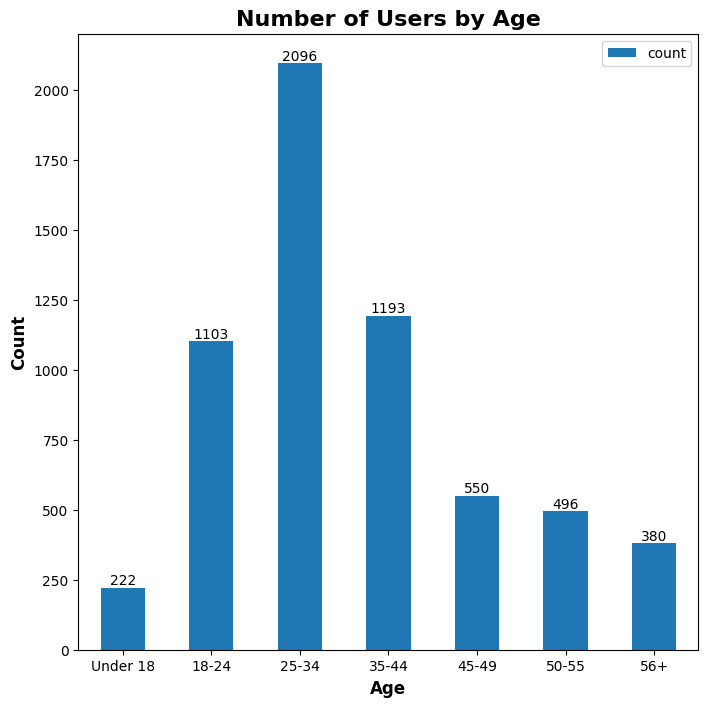

In [23]:
import matplotlib.pyplot as plt

age_counts.plot(kind='bar', figsize=(8, 8))

plt.xticks(rotation=0)
plt.xlabel('Age', fontdict={'fontsize': 12, 'fontweight': 'bold'})
plt.ylabel('Count', fontdict={'fontsize': 12, 'fontweight': 'bold'})
plt.title('Number of Users by Age', 
          fontdict={'fontsize': 16, 'fontweight': 'bold'})
# Display value on each bar
for i, count in enumerate(age_counts['count']):
    plt.text(i, count, str(count), ha='center', va='bottom')

plt.show()


In [24]:
all_ages = sorted(users['age'].unique()) 
all_ages

[1, 18, 25, 35, 45, 50, 56]

### Ratings by age

In [25]:
users_ratings_movies.groupby('age')['rating'].describe()

,count,mean,std,min,25%,50%,75%,max
age,,,,,,,,
1,49003.0,3.551048,1.207883,1.0,3.0,4.0,5.0,5.0
18,326737.0,3.527467,1.169698,1.0,3.0,4.0,4.0,5.0
25,692571.0,3.569409,1.124968,1.0,3.0,4.0,4.0,5.0
35,348350.0,3.638232,1.077817,1.0,3.0,4.0,4.0,5.0
45,144469.0,3.656868,1.065718,1.0,3.0,4.0,4.0,5.0
50,124476.0,3.726534,1.060095,1.0,3.0,4.0,5.0,5.0
56,66006.0,3.771900,1.067878,1.0,3.0,4.0,5.0,5.0


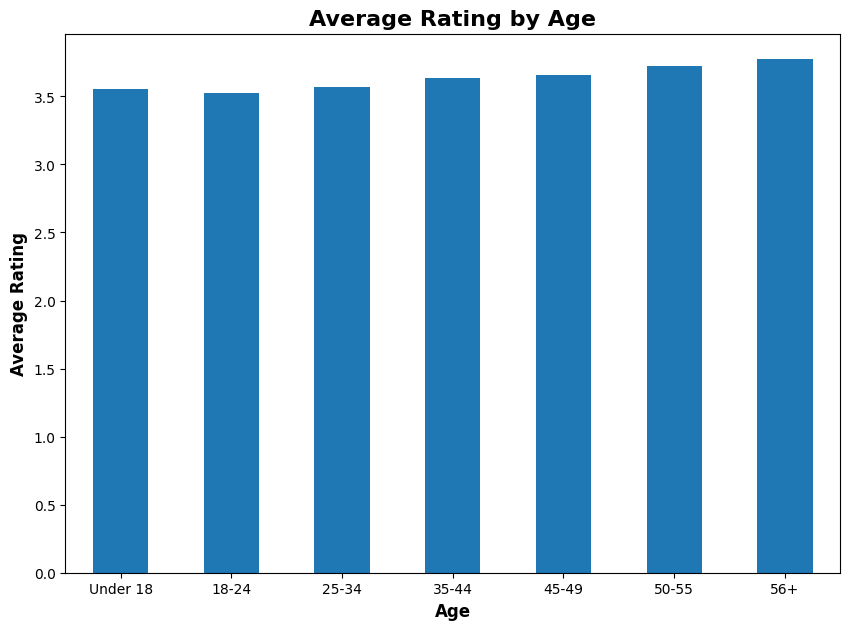

In [26]:
users_ratings_movies.groupby('age')['rating'].mean().plot(kind='bar', figsize=(10, 7))

plt.xticks(rotation=0, 
              ticks=range(len(all_ages)),
           labels=[age_groups[age] for age in users_ratings_movies.groupby('age').groups.keys()])
plt.xlabel('Age', fontdict={'fontsize': 12, 'fontweight': 'bold'})
plt.ylabel('Average Rating', fontdict={'fontsize': 12, 'fontweight': 'bold'})
plt.title('Average Rating by Age', 
          fontdict={'fontsize': 16, 'fontweight': 'bold'})
plt.show()

### Ratings by age and movie year

In [27]:
age_groups_ratings_by_year = users_ratings_movies.groupby(['age', 'year'])['rating'].mean().to_frame()
age_groups_ratings_by_year = age_groups_ratings_by_year.pivot_table(columns='age', index='year', values='rating')
age_groups_ratings_by_year

age,1,18,25,35,45,50,56
year,,,,,,,
1919,NaN,2.000000,NaN,2.000000,NaN,4.000000,NaN
1921,2.333333,3.428571,3.818182,4.000000,4.333333,3.857143,3.666667
1923,NaN,1.500000,4.500000,3.000000,3.800000,4.000000,NaN
1925,4.047619,3.851064,3.948718,4.075269,3.981982,4.242424,4.333333
1926,4.888889,3.610169,4.000000,3.969697,4.020833,4.194444,4.076923
...,...,...,...,...,...,...,...
1996,3.350326,3.273149,3.314963,3.405596,3.488328,3.483347,3.538486
1997,3.362477,3.344501,3.373290,3.458867,3.439762,3.526879,3.572669
1998,3.427560,3.428189,3.432592,3.521039,3.515773,3.548035,3.617480


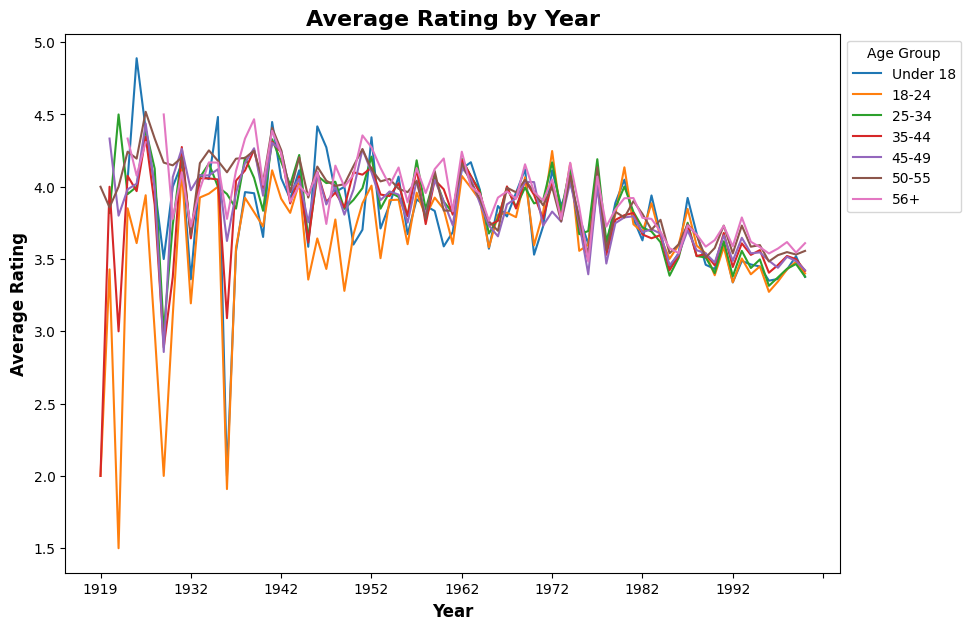

In [28]:
# plot lines chart, each line is a age group
age_groups_ratings_by_year.plot(figsize=(10, 7))

plt.xticks(rotation=0)
plt.xlabel('Year', fontdict={'fontsize': 12, 'fontweight': 'bold'})
plt.ylabel('Average Rating', fontdict={'fontsize': 12, 'fontweight': 'bold'})
plt.title('Average Rating by Year', 
          fontdict={'fontsize': 16, 'fontweight': 'bold'})
plt.legend(bbox_to_anchor=(1, 1), loc='upper left', 
           title='Age Group', labels=[age_groups[age] for age in age_groups_ratings_by_year.columns])
plt.show()

### Genres ratings by age

In [29]:
age_average_ratings = pd.DataFrame(index=all_genres)

for age in all_ages:
    age_average_ratings[age_groups[age]] = users_ratings_movies[users_ratings_movies['age'] == age].groupby('genre')['rating'].mean()

age_average_ratings

,Under 18,18-24,25-34,35-44,45-49,50-55,56+
Crime,3.713621,3.672385,3.696453,3.755894,3.774806,3.833299,3.867960
Thriller,3.577051,3.524249,3.569803,3.637155,3.660180,3.727501,3.719292
Fantasy,3.312450,3.340822,3.442315,3.464141,3.524158,3.574534,3.533565
Horror,3.287300,3.186804,3.218410,3.298209,3.293071,3.186028,3.296784
Sci-Fi,3.519400,3.465396,3.485138,3.530698,3.509476,3.582511,3.520957
Comedy,3.505633,3.472298,3.503682,3.569133,3.595039,3.648267,3.650295
Documentary,3.690000,3.884024,3.971952,3.969207,3.951550,3.889412,3.904523
Adventure,3.454413,3.418104,3.468481,3.535444,3.548496,3.637025,3.679172
Film-Noir,4.172078,4.017486,4.111524,4.117565,4.141884,4.206064,4.153271
Animation,3.496657,3.642453,3.705345,3.744603,3.736316,3.766403,3.769311


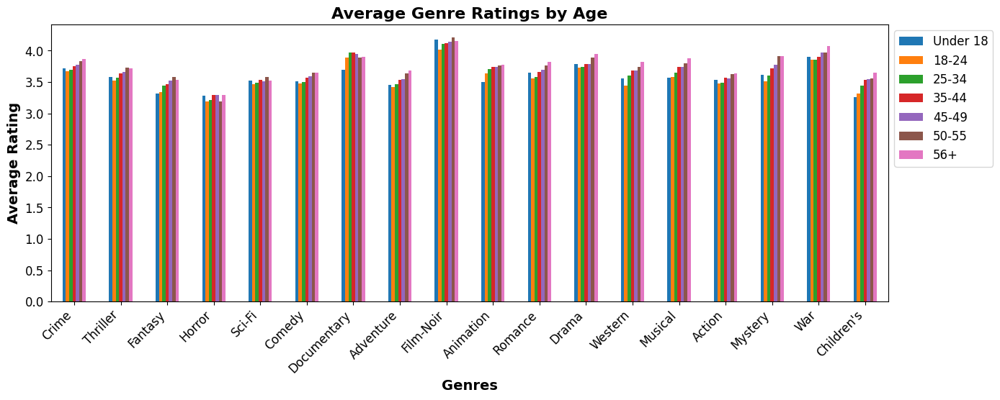

In [30]:
age_average_ratings.plot(kind='bar', figsize=(15, 5), fontsize=12)

plt.xticks(rotation=45, ha='right')

plt.xlabel('Genres', fontdict={'fontsize': 14, 'fontweight': 'bold'})
plt.ylabel('Average Rating', fontdict={'fontsize': 14, 'fontweight': 'bold'})
plt.title('Average Genre Ratings by Age', fontdict={'fontsize': 16, 'fontweight': 'bold'})
# Place the legend outside the plot
plt.legend(bbox_to_anchor=(1, 1), loc='upper left', fontsize=12)
plt.show()

### Group by production year and age for each genre

In [46]:
age_groups_ratings_by_year_genres = users_ratings_movies.groupby(['age', 'year', 'genre'])['rating'].mean().to_frame()
age_groups_ratings_by_year_genres = age_groups_ratings_by_year_genres.pivot_table(index='age', columns=['year', 'genre'], values='rating')

age_groups_ratings_by_year_genres

year       1919            1921      1923                1925             
genre Adventure Drama    Action    Comedy     Drama    Comedy     Drama   
age                                                                       
1           NaN   NaN  2.333333       NaN       NaN  4.111111  4.000000  \
18          2.0   2.0  3.428571  1.000000  1.666667  3.800000  3.875000   
25          NaN   NaN  3.818182  4.500000       NaN  4.148936  3.814286   
35          2.0   2.0  4.000000  3.333333  2.500000  4.097561  4.057692   
45          NaN   NaN  4.333333  3.666667  4.000000  4.039216  3.933333   
50          4.0   4.0  3.857143       NaN  4.000000  4.390244  4.137931   
56          NaN   NaN  3.666667       NaN       NaN  4.333333  4.333333   

year                 1926            ...        2000                       
genre       War Adventure    Comedy  ... Documentary     Drama   Fantasy   
age                                  ...                                   
1      4.000000       NaN       NaN  ...    3.000000  3.564315  2.166667  \
18     3.875000      3.00  2.000000  ...    3.287500  3.651772  2.722222   
25     3.814286      3.60  4.333333  ...    3.545455  3.608351  2.436364   
35     4.057692      4.50  2.000000  ...    3.400000  3.707158  2.000000   
45     3.933333      3.25  3.000000  ...    3.277778  3.616422  2.555556   
50     4.137931      3.50       NaN  ...    3.571429  3.844776  2.000000   
56     4.333333       NaN  4.000000  ...    2.250000  3.843348  2.000000   

year                                                                         
genre    Horror   Musical   Mystery   Romance    Sci-Fi  Thriller       War  
age                                                                          
1      3.221239  3.600000  3.113636  3.135417  3.428571  3.316129  3.859649  
18     3.033816  4.134615  2.725581  3.176339  3.365445  3.164973  3.771626  
25     2.968835  3.703704  2.697778  3.238690  3.303011  3.180037  3.626033  
35     2.971074  4.096774  2.698413  3.446352  3.236196  3.237369  3.801932  
45     2.750000  3.166667  2.444444  3.201550  3.174672  3.347319  3.845455  
50     2.830189  3.600000  2.900000  3.426667  3.214286  3.439655  3.930233  
56     2.750000  3.333333  2.000000  3.906977  3.226804  3.383234  3.907895  

[7 rows x 845 columns]

In [71]:
print(age_groups[age_groups_ratings_by_year_genres.iloc[0].name])
age_groups_ratings_by_year_genres.iloc[0].to_frame().pivot_table(columns='genre', index='year').droplevel(0, axis=1)


Under 18


genre,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
year,,,,,,,,,,,,,,,,,,
1921,2.333333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1925,NaN,NaN,NaN,NaN,4.111111,NaN,NaN,4.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,NaN
1926,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.888889,NaN,NaN,NaN
1927,NaN,NaN,NaN,NaN,4.400000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1928,NaN,NaN,NaN,NaN,4.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1996,3.460674,3.310606,3.142012,2.922601,3.180055,3.820225,4.166667,3.762431,2.976744,4.000000,3.351351,3.157025,4.000000,3.485075,3.449219,3.521277,3.547619,3.000000
1997,3.267951,3.181818,3.673913,2.909465,3.379172,3.613260,3.538462,3.660819,2.800000,4.170213,3.115942,3.066667,3.556180,3.393574,3.446384,3.325203,2.957143,NaN
1998,3.475472,2.779661,3.310345,3.188953,3.504098,3.685864,3.285714,3.656357,2.468750,4.230769,2.787611,3.388889,3.300885,3.664000,3.174312,3.349904,3.854167,NaN


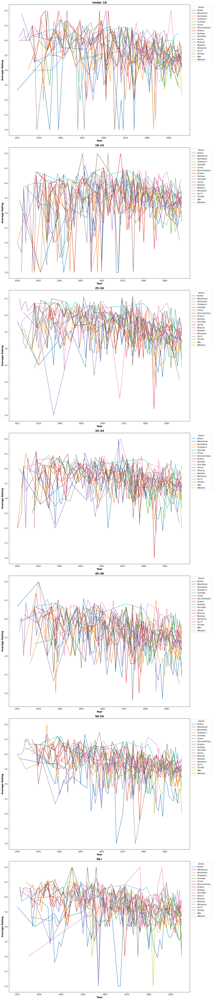

In [92]:
import seaborn as sns
fig, axes = plt.subplots(7, 1, figsize=(15, 10*7), dpi=150)

for i, age in enumerate(all_ages):
    age_group_ratings_by_year_genres = age_groups_ratings_by_year_genres.loc[age].to_frame().pivot_table(columns='genre', index='year').droplevel(0, axis=1)
    # plot lines chart, each line is a genre avg rating by year
    sns.lineplot(data=age_group_ratings_by_year_genres, ax=axes[i], palette='tab10', dashes=False)
    axes[i].set_title(age_groups[age], fontdict={'fontsize': 14, 'fontweight': 'bold'})
    axes[i].set_xlabel('Year', fontdict={'fontsize': 12, 'fontweight': 'bold'})
    axes[i].set_ylabel('Average Rating', fontdict={'fontsize': 12, 'fontweight': 'bold'})
    axes[i].legend(bbox_to_anchor=(1, 1), loc='upper left',
                     title='Genre', labels=age_group_ratings_by_year_genres.columns)
    axes[i].set_xticks(range(0, len(age_group_ratings_by_year_genres.index), 10))
    axes[i].set_xticklabels(age_group_ratings_by_year_genres.index[::10])

plt.tight_layout()
plt.show()

### Group by both gender and age

In [132]:
women_ages_average_ratings = pd.DataFrame(index=all_genres)

for age in all_ages:
    women_ages_average_ratings[age_groups[age]] = users_ratings_movies[(users_ratings_movies['age'] == age) & (users_ratings_movies['gender'] == 'F')].groupby('genre')['rating'].mean()

women_ages_average_ratings

,Under 18,18-24,25-34,35-44,45-49,50-55,56+
Crime,3.678899,3.548919,3.704063,3.714573,3.727207,3.873905,4.011605
Thriller,3.613333,3.407108,3.602743,3.608270,3.637527,3.780446,3.867058
Fantasy,3.421589,3.270270,3.575670,3.532468,3.516084,3.675057,3.729885
Horror,3.175476,3.122406,3.199085,3.309661,3.345776,3.424399,3.399209
Sci-Fi,3.497494,3.345476,3.491082,3.507677,3.492710,3.571713,3.500732
Comedy,3.568839,3.437105,3.573251,3.640493,3.603025,3.717661,3.832439
Documentary,3.904762,3.971264,4.020443,3.905660,3.987097,4.037037,3.816667
Adventure,3.549952,3.368285,3.528955,3.585677,3.546178,3.654557,3.776371
Film-Noir,4.111111,3.852804,4.063313,4.021226,4.112745,4.166253,4.169173
Animation,3.742925,3.631890,3.786719,3.801737,3.775949,3.807183,3.911348


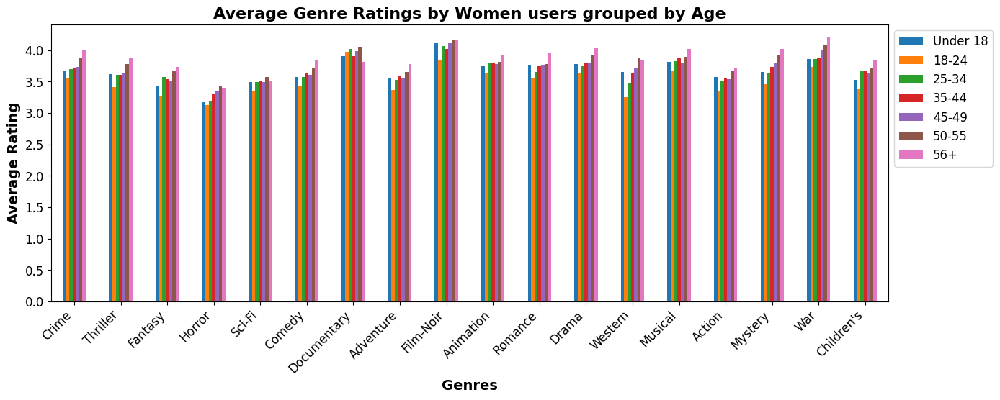

In [133]:
women_ages_average_ratings.plot(kind='bar', figsize=(15, 5), fontsize=12)

plt.xticks(rotation=45, ha='right')

plt.xlabel('Genres', fontdict={'fontsize': 14, 'fontweight': 'bold'})
plt.ylabel('Average Rating', fontdict={'fontsize': 14, 'fontweight': 'bold'})
plt.title('Average Genre Ratings by Women users grouped by Age', fontdict={'fontsize': 16, 'fontweight': 'bold'})
plt.legend(bbox_to_anchor=(1, 1), loc='upper left', fontsize=12)

plt.show()

In [134]:
men_ages_average_ratings = pd.DataFrame(index=all_genres)

for age in all_ages:
    men_ages_average_ratings[age_groups[age]] = users_ratings_movies[(users_ratings_movies['age'] == age) & (users_ratings_movies['gender'] == 'M')].groupby('genre')['rating'].mean()

men_ages_average_ratings

,Under 18,18-24,25-34,35-44,45-49,50-55,56+
Crime,3.723260,3.701472,3.694640,3.768397,3.791903,3.820680,3.832781
Thriller,3.566213,3.554201,3.561740,3.645859,3.668310,3.712806,3.684014
Fantasy,3.242857,3.363505,3.406855,3.441109,3.527460,3.545151,3.484058
Horror,3.333333,3.203772,3.222464,3.295261,3.279015,3.141434,3.273543
Sci-Fi,3.525796,3.490077,3.484002,3.535921,3.514055,3.584705,3.525052
Comedy,3.471992,3.485558,3.479517,3.542877,3.591550,3.621680,3.589404
Documentary,3.632911,3.861401,3.957576,3.989806,3.936288,3.820690,3.942446
Adventure,3.412259,3.431062,3.454962,3.521362,3.549251,3.632827,3.657261
Film-Noir,4.190678,4.059242,4.123862,4.147457,4.151741,4.219291,4.148010
Animation,3.329053,3.646975,3.680840,3.721201,3.718039,3.748991,3.710059


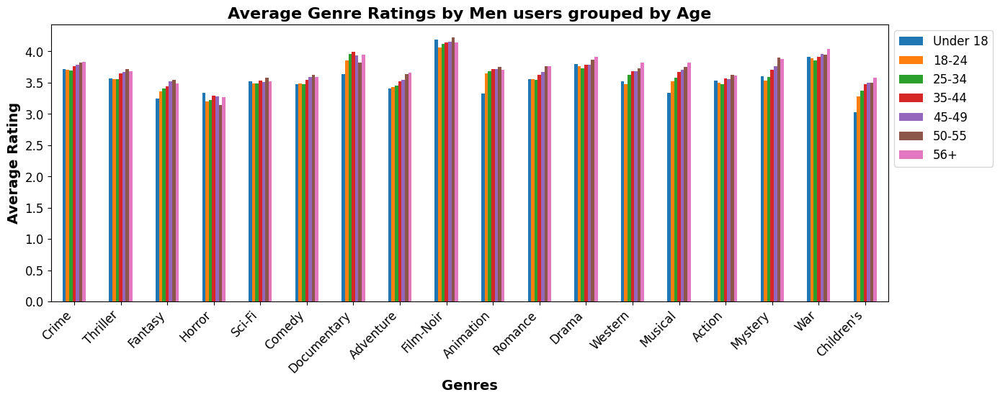

In [136]:
men_ages_average_ratings.plot(kind='bar', figsize=(15, 5), fontsize=12)

plt.xticks(rotation=45, ha='right')

plt.xlabel('Genres', fontdict={'fontsize': 14, 'fontweight': 'bold'})
plt.ylabel('Average Rating', fontdict={'fontsize': 14, 'fontweight': 'bold'})
plt.title('Average Genre Ratings by Men users grouped by Age', fontdict={'fontsize': 16, 'fontweight': 'bold'})

plt.legend(bbox_to_anchor=(1, 1), loc='upper left', fontsize=12)

plt.show()

## Occupation 

In [137]:
with open('Occupation.json', 'r') as f:
    occupation_groups = json.load(f)
    occupation_groups = {int(key): value for key, value in occupation_groups.items()}

occupation_groups

{0: 'other or not specified',
 1: 'academic/educator',
 2: 'artist',
 3: 'clerical/admin',
 4: 'college/grad student',
 5: 'customer service',
 6: 'doctor/health care',
 7: 'executive/managerial',
 8: 'farmer',
 9: 'homemaker',
 10: 'K-12 student',
 11: 'lawyer',
 12: 'programmer',
 13: 'retired',
 14: 'sales/marketing',
 15: 'scientist',
 16: 'self-employed',
 17: 'technician/engineer',
 18: 'tradesman/craftsman',
 19: 'unemployed',
 20: 'writer'}

In [139]:
ooccupation_counts = users['occupation'].value_counts().to_frame().sort_values(by='occupation')
ooccupation_counts.index = ooccupation_counts.index.map(occupation_groups)
ooccupation_counts

,count
occupation,
other or not specified,711
academic/educator,528
artist,267
clerical/admin,173
college/grad student,759
customer service,112
doctor/health care,236
executive/managerial,679
farmer,17


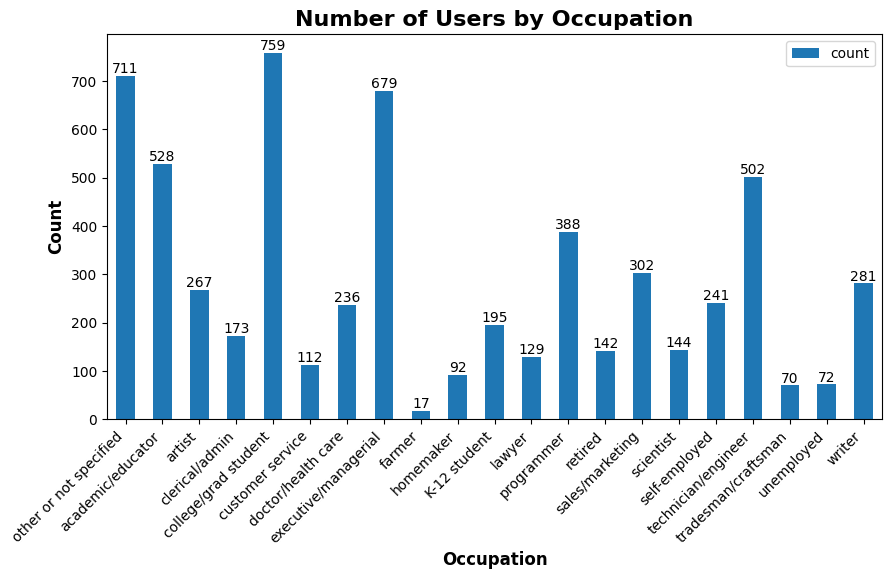

In [141]:
ooccupation_counts.plot(kind='bar', figsize=(10, 5))

plt.xticks(rotation=45, ha='right')

plt.xlabel('Occupation', fontdict={'fontsize': 12, 'fontweight': 'bold'})
plt.ylabel('Count', fontdict={'fontsize': 12, 'fontweight': 'bold'})
plt.title('Number of Users by Occupation', fontdict={'fontsize': 16, 'fontweight': 'bold'})
# Display value on each bar
for i, count in enumerate(ooccupation_counts['count']):
    plt.text(i, count, str(count), ha='center', va='bottom')

plt.show()

In [142]:
all_occupations = sorted(users['occupation'].unique())
all_occupations

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

In [143]:
users_ratings_movies.groupby('occupation')['rating'].describe()

,count,mean,std,min,25%,50%,75%,max
occupation,,,,,,,,
0,225861.0,3.553841,1.126091,1.0,3.0,4.0,4.0,5.0
1,146331.0,3.583294,1.109669,1.0,3.0,4.0,4.0,5.0
2,85812.0,3.590127,1.142777,1.0,3.0,4.0,4.0,5.0
3,54241.0,3.670618,1.096684,1.0,3.0,4.0,5.0,5.0
4,231553.0,3.555925,1.168756,1.0,3.0,4.0,4.0,5.0
5,38328.0,3.564679,1.105041,1.0,3.0,4.0,4.0,5.0
6,63769.0,3.685161,1.106869,1.0,3.0,4.0,5.0,5.0
7,184391.0,3.628295,1.080884,1.0,3.0,4.0,4.0,5.0
8,4953.0,3.508581,1.089297,1.0,3.0,4.0,4.0,5.0


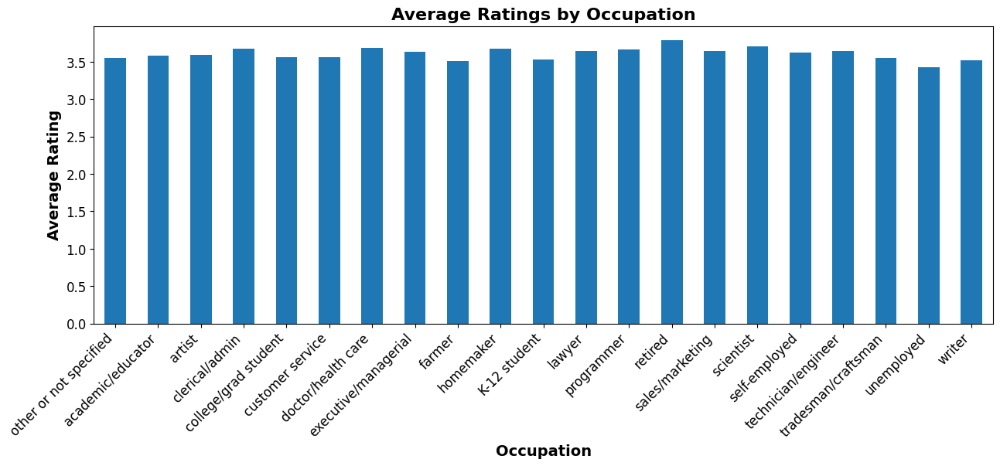

In [144]:
users_ratings_movies.groupby('occupation')['rating'].mean().plot(kind='bar', figsize=(15, 5), fontsize=12)

plt.xticks(rotation=45, ha='right',
           ticks=range(len(all_occupations)),
           labels=[occupation_groups[occupation] for occupation in users_ratings_movies.groupby('occupation').groups.keys()])
plt.xlabel('Occupation', fontdict={'fontsize': 14, 'fontweight': 'bold'})
plt.ylabel('Average Rating', fontdict={'fontsize': 14, 'fontweight': 'bold'})
plt.title('Average Ratings by Occupation', fontdict={'fontsize': 16, 'fontweight': 'bold'})

plt.show()

In [145]:
occupations_average_ratings = pd.DataFrame(index=all_genres)

for occupation in all_occupations:
    occupations_average_ratings[occupation_groups[occupation]] = users_ratings_movies[users_ratings_movies['occupation'] == occupation].groupby('genre')['rating'].mean()

occupations_average_ratings

,other or not specified,academic/educator,artist,clerical/admin,college/grad student,customer service,doctor/health care,executive/managerial,farmer,homemaker,...,lawyer,programmer,retired,sales/marketing,scientist,self-employed,technician/engineer,tradesman/craftsman,unemployed,writer
Crime,3.672485,3.672711,3.690190,3.755442,3.730674,3.712162,3.831833,3.756675,3.615385,3.670436,...,3.749362,3.779542,3.876853,3.751384,3.837731,3.756082,3.736081,3.647321,3.649209,3.664541
Thriller,3.525608,3.544247,3.585069,3.666946,3.547786,3.573799,3.676166,3.653549,3.536765,3.675287,...,3.647218,3.697145,3.790596,3.639550,3.690374,3.595311,3.650854,3.598282,3.439121,3.492591
Fantasy,3.416961,3.441906,3.426617,3.450837,3.354292,3.432591,3.480717,3.460688,3.389706,3.601078,...,3.510753,3.484975,3.646465,3.579631,3.525084,3.474843,3.518085,3.408257,3.197822,3.318339
Horror,3.146124,3.137185,3.262548,3.330399,3.178202,3.289967,3.273828,3.259980,2.962121,3.281928,...,3.286004,3.381547,3.368237,3.343354,3.347673,3.289739,3.220822,3.317460,3.138580,3.243074
Sci-Fi,3.433591,3.429756,3.536106,3.587470,3.456027,3.475269,3.513388,3.543297,3.434125,3.480856,...,3.510529,3.599671,3.576181,3.527699,3.567340,3.529472,3.563335,3.520274,3.345542,3.422053
Comedy,3.502736,3.523311,3.517873,3.605589,3.499749,3.476065,3.606632,3.525142,3.498029,3.577875,...,3.569571,3.606447,3.653201,3.567082,3.702194,3.513913,3.586427,3.455166,3.404193,3.436499
Documentary,3.867371,4.051155,4.000000,3.896226,3.983871,3.807692,4.021645,3.942801,3.714286,3.857143,...,4.110390,3.832776,3.950000,3.907080,3.992000,3.945860,4.058419,3.736842,3.750000,3.936479
Adventure,3.442985,3.443095,3.468507,3.567687,3.433972,3.496192,3.572587,3.534330,3.433333,3.688073,...,3.511575,3.583418,3.677396,3.543228,3.597508,3.533895,3.583691,3.456451,3.294010,3.365256
Film-Noir,4.110662,4.123750,4.165888,4.109375,4.069436,4.133803,4.068966,4.068323,3.914286,3.776699,...,4.193684,4.157017,4.204360,4.155680,4.254408,4.147887,4.096661,3.918129,4.098712,4.125500
Animation,3.679592,3.690922,3.621245,3.836752,3.671202,3.764706,3.703595,3.709097,3.553571,3.785959,...,3.744113,3.707757,3.583893,3.768380,3.856823,3.732256,3.745085,3.730303,3.400411,3.700877


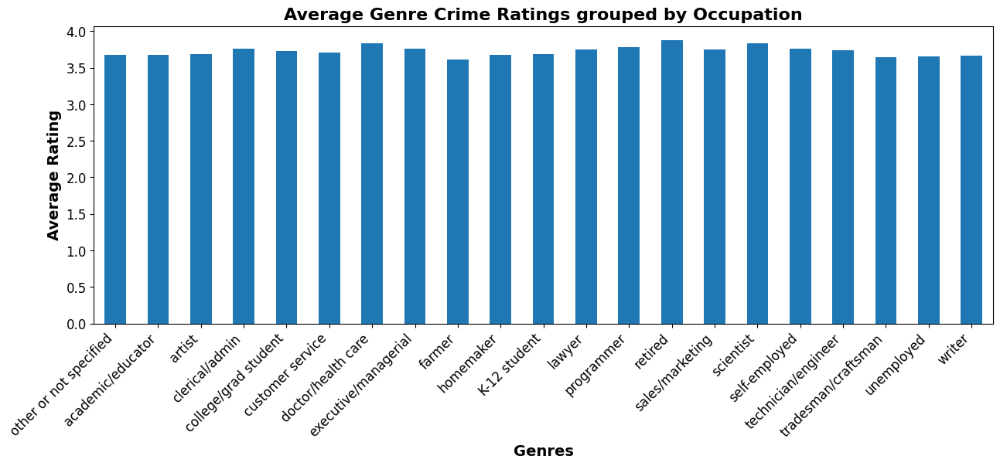

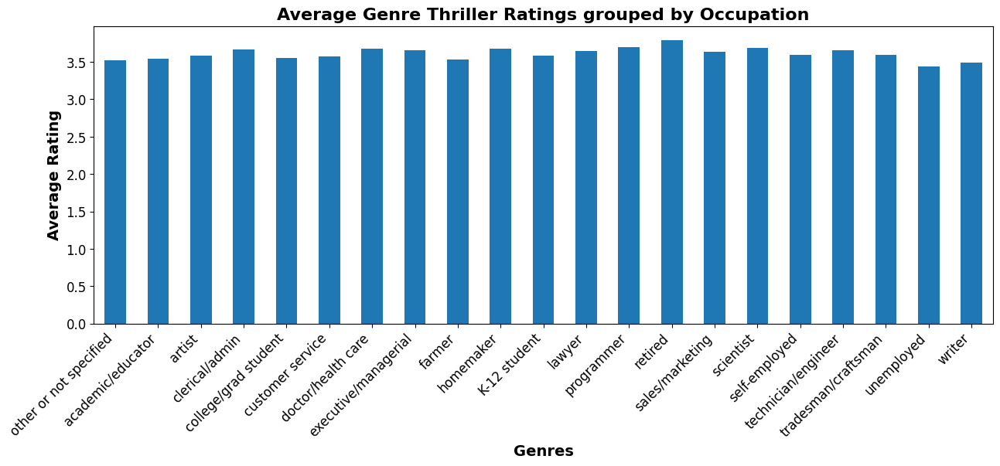

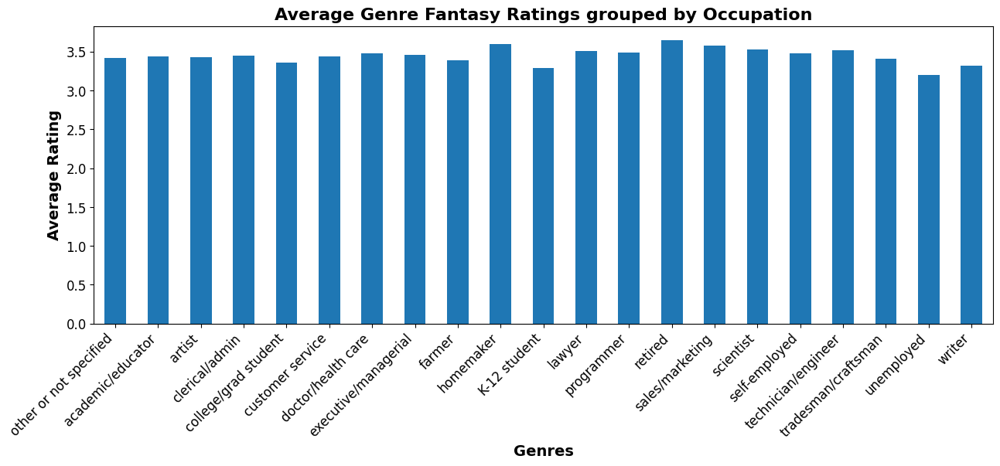

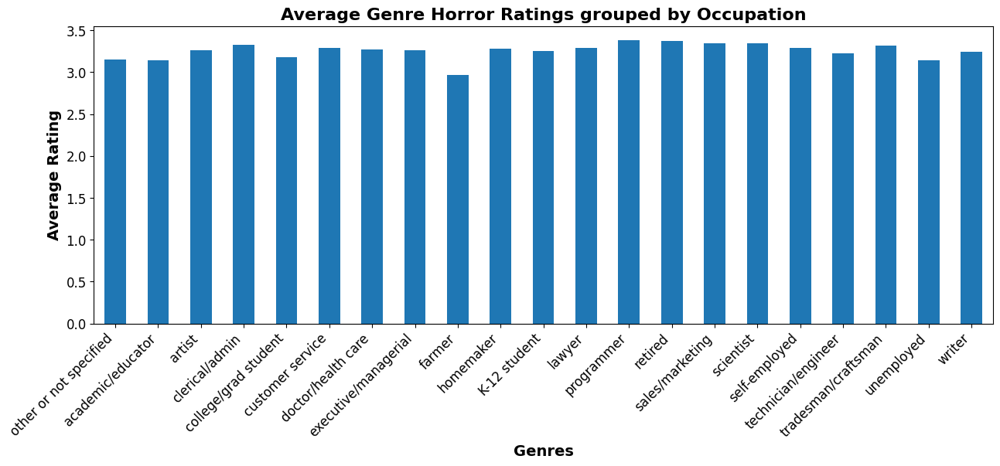

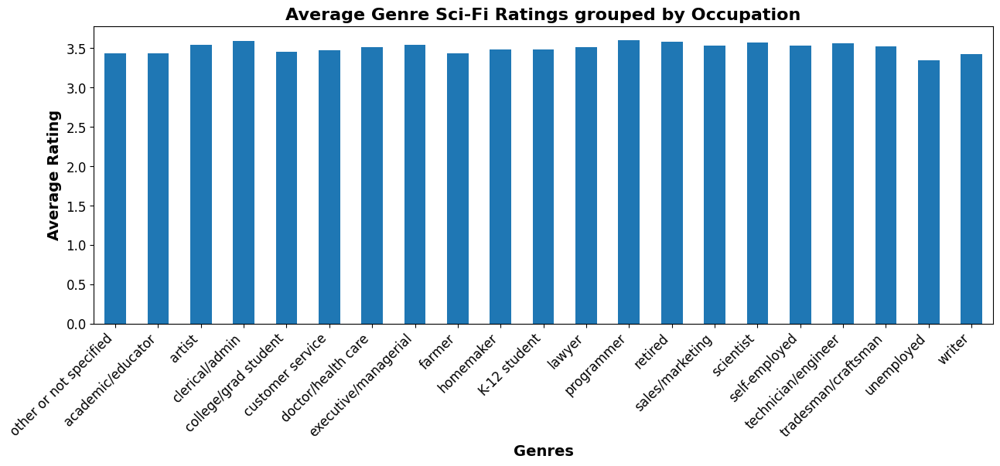

...

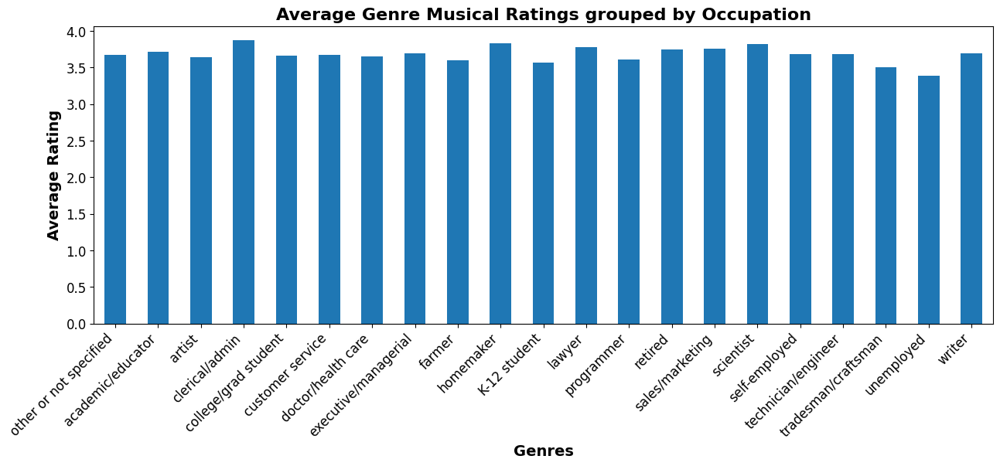

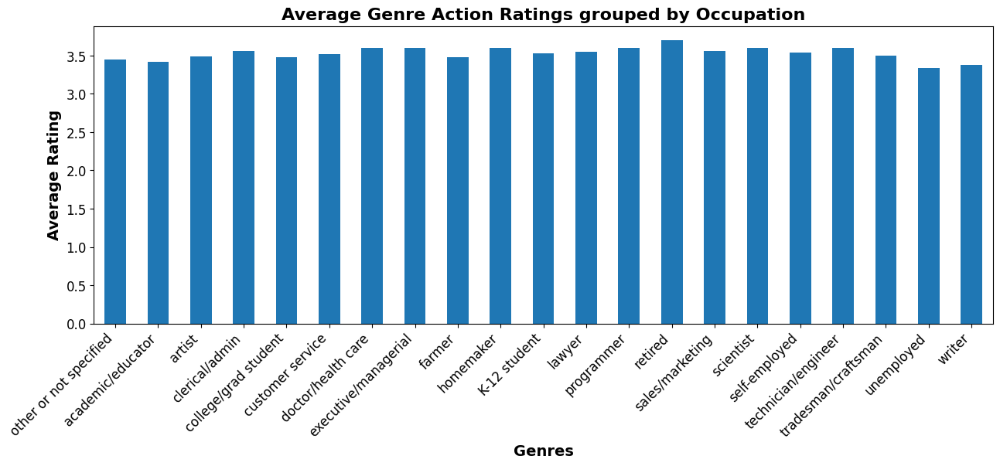

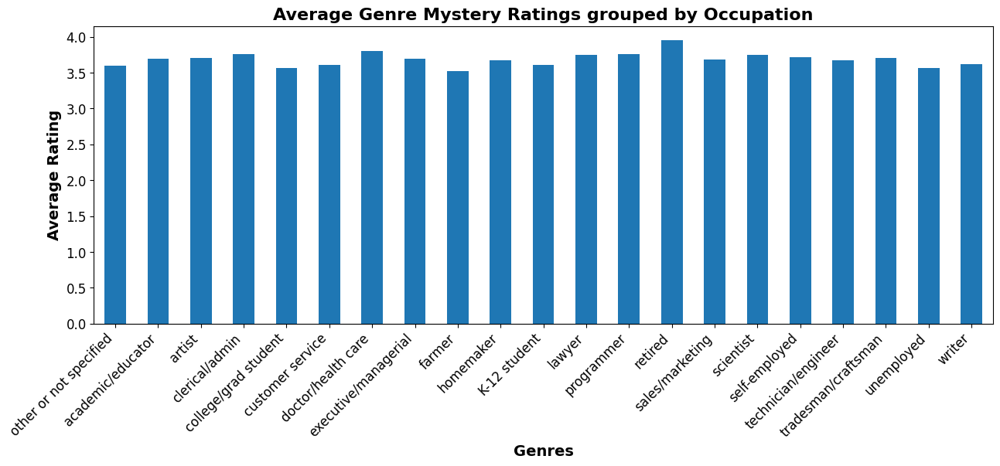

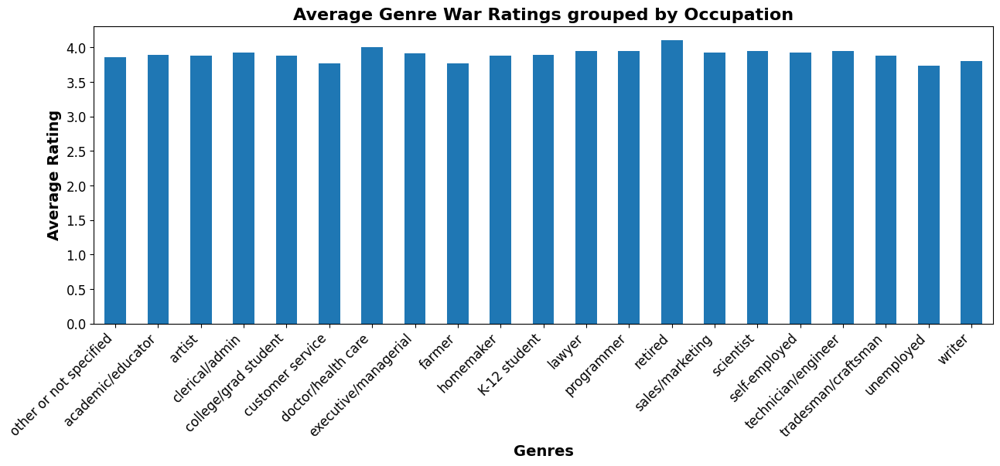

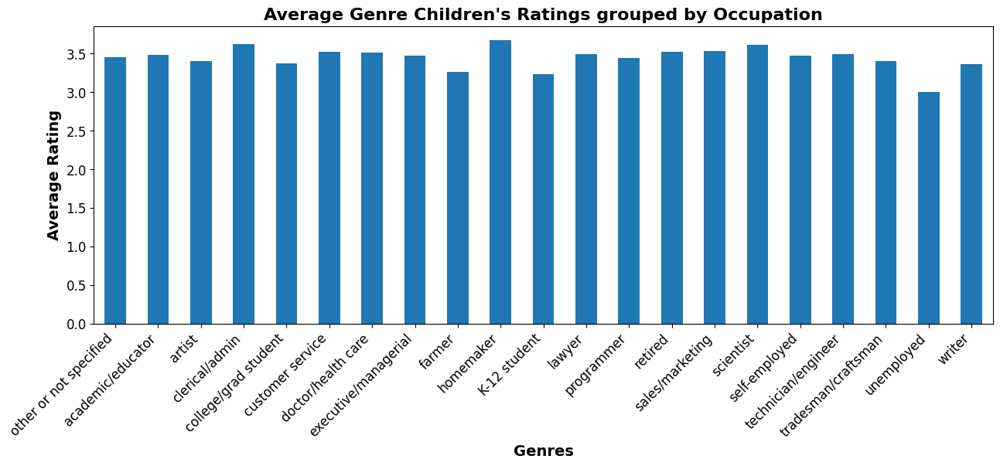

In [154]:
# Iterate over the index of the dataframe
for i in range(len(occupations_average_ratings)):
    # plot each row of the dataframe
    occupations_average_ratings.iloc[i].plot(kind='bar', figsize=(15, 5), fontsize=12)

    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Genres', fontdict={'fontsize': 14, 'fontweight': 'bold'})
    plt.ylabel('Average Rating', fontdict={'fontsize': 14, 'fontweight': 'bold'})
    plt.title(f'Average Genre {occupations_average_ratings.index[i]} Ratings grouped by Occupation', 
              fontdict={'fontsize': 16, 'fontweight': 'bold'})
    
    plt.show()

In [159]:
# most highly rated genres by each occupation
occupations_average_ratings.idxmax(axis=0).to_frame()

,0
other or not specified,Film-Noir
academic/educator,Film-Noir
artist,Film-Noir
clerical/admin,Film-Noir
college/grad student,Film-Noir
customer service,Film-Noir
doctor/health care,Film-Noir
executive/managerial,Film-Noir
farmer,Film-Noir
homemaker,War


In [160]:
# most lowly rated genres by each occupation
occupations_average_ratings.idxmin(axis=0).to_frame()

,0
other or not specified,Horror
academic/educator,Horror
artist,Horror
clerical/admin,Horror
college/grad student,Horror
customer service,Horror
doctor/health care,Horror
executive/managerial,Horror
farmer,Horror
homemaker,Horror


### Occupation and age

In [167]:
ooccupation_age_counts = users.pivot_table(index='occupation', columns='age', aggfunc='size', fill_value=0)
ooccupation_age_counts.index = ooccupation_age_counts.index.map(lambda x: (occupation_groups[x],))
ooccupation_age_counts.columns = ooccupation_age_counts.columns.map(lambda x: (age_groups[x],))
ooccupation_age_counts

age,Under 18,18-24,25-34,35-44,45-49,50-55,56+
occupation,,,,,,,
other or not specified,27,106,298,135,66,46,33
academic/educator,4,45,156,118,80,70,55
artist,3,44,113,47,30,18,12
clerical/admin,0,18,68,42,17,16,12
college/grad student,3,534,200,14,3,5,0
customer service,0,18,52,25,10,6,1
doctor/health care,0,9,76,59,31,40,21
executive/managerial,2,17,253,214,74,80,39
farmer,1,1,6,3,1,2,3


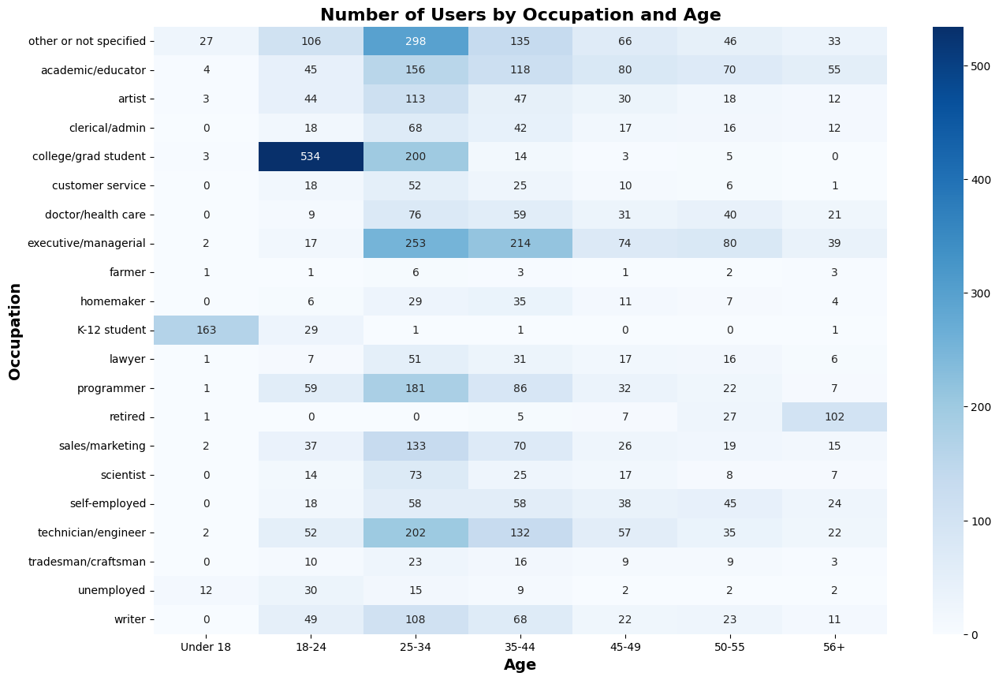

In [168]:
# plot heatmap
import seaborn as sns

plt.figure(figsize=(15, 10))
sns.heatmap(ooccupation_age_counts, annot=True, fmt='d', cmap='Blues')

plt.xlabel('Age', fontdict={'fontsize': 14, 'fontweight': 'bold'})
plt.ylabel('Occupation', fontdict={'fontsize': 14, 'fontweight': 'bold'})
plt.title('Number of Users by Occupation and Age', fontdict={'fontsize': 16, 'fontweight': 'bold'})

plt.show()

### Occupation and gender

In [169]:
occupation_gender_counts = users.pivot_table(index='occupation', columns='gender', aggfunc='size', fill_value=0)
occupation_gender_counts.index = occupation_gender_counts.index.map(lambda x: (occupation_groups[x],))
occupation_gender_counts

gender,F,M
occupation,,
other or not specified,232,479
academic/educator,209,319
artist,91,176
clerical/admin,100,73
college/grad student,234,525
customer service,31,81
doctor/health care,102,134
executive/managerial,139,540
farmer,3,14
